# Feature Pairs by Season + Climate Correlations (no PCA)

This extends `Clustering_FeaturePairs.ipynb` with everything the professors asked for:

1. **More variables.** Beyond `milk_kg, DIM, parity, AFC` we now also use **protein %**, **fat %**, **SCS**, and the **climate** drivers **THI, Temperature, Humidity** (merged per farm/test-date from `farm_weather_indices/`).
2. **Summer / winter split.** Every test-day record is assigned to **exactly one** season from its calendar month (warm half = summer, cold half = winter). No record is in both.
3. **Season shown on every plot.** Each scatter is coloured by season with a per-season regression line and **per-season Pearson correlation**, so the *effect of season on the relationship* is visible directly.

**Two families of pairs** (and, per your fix, `milk_kg` is always on the **Y** axis):

* **Family A — trait × trait:** all pairs among `DIM, parity, AFC, protein_p, fat_p, SCS, milk_kg`.
* **Family B — climate × trait:** X axis = one of `THI, Temperature, Humidity`; Y axis = one of `milk_kg, DIM, parity, AFC, protein_p, fat_p, SCS`.

No PCA anywhere — every axis is a real measured variable. Original files are only **read**.

In [3]:
import os, glob
from itertools import combinations

N_JOBS = max(1, (os.cpu_count() or 2) - 1)
for _v in ('OMP_NUM_THREADS', 'OPENBLAS_NUM_THREADS', 'MKL_NUM_THREADS', 'NUMEXPR_NUM_THREADS'):
    os.environ.setdefault(_v, str(min(N_JOBS, 8)))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
pd.set_option('display.float_format', lambda x: f'{x:,.3f}')

# ---- Variable groups ----
# Animal/production traits. milk_kg is LAST so combinations() always puts it 2nd -> Y axis.
TRAITS   = ['DIM', 'parity', 'AFC', 'protein_p', 'fat_p', 'SCS', 'milk_kg']
# Climate drivers: display name -> column in the weather files.
CLIMATE  = {'THI': 'THI_2_max', 'Temperature': 'temperature_max', 'Humidity': 'humidity_avg'}
# For Family B the Y axis can be any trait (milk_kg first so it leads the grid).
TRAITS_Y = ['milk_kg', 'DIM', 'parity', 'AFC', 'protein_p', 'fat_p', 'SCS']

# ---- Season: each record belongs to exactly ONE season (warm half vs cold half) ----
# Edit this set to change the definition (e.g. strict summer {6,7,8,9}).
WARM_MONTHS = {4, 5, 6, 7, 8, 9}
SEASON_COLORS = {'summer': '#d62728', 'winter': '#1f77b4'}

PAIRS_A = list(combinations(TRAITS, 2))                       # trait x trait
PAIRS_B = [(c, t) for c in CLIMATE for t in TRAITS_Y]         # climate x trait
print(f'Family A (trait x trait): {len(PAIRS_A)} pairs')
print(f'Family B (climate x trait): {len(PAIRS_B)} pairs')

Family A (trait x trait): 21 pairs
Family B (climate x trait): 21 pairs


In [4]:
# ---- Load production data (READ ONLY) ----
PATH = '../Thesis_Data/Final_Data/After_Processing.csv'
df = pd.read_csv(PATH, usecols=['Farm_Code', 'Animal_ID', 'parity', 'DIM', 'milk_kg',
                                'AFC', 'protein_p', 'fat_p', 'SCS', 'dtt'])
if df['AFC'].dtype == object:
    df['AFC'] = pd.to_timedelta(df['AFC']).dt.days          # '870 days' -> 870
df = df[(df['milk_kg'] > 0) & (df['DIM'].between(1, 365))]

df['farm'] = df['Farm_Code'].astype(str).str.replace(r'\.0$', '', regex=True)
df['date'] = pd.to_datetime(df['dtt'], errors='coerce')
df = df.dropna(subset=['date'])
df['month'] = df['date'].dt.month
df['dstr'] = df['date'].dt.strftime('%Y-%m-%d')

# Season label: exactly one per record.
df['season'] = np.where(df['month'].isin(WARM_MONTHS), 'summer', 'winter')
print(f'{len(df):,} records loaded')

1,646,809 records loaded


In [5]:
# ---- Merge climate (THI, Temperature, Humidity) per farm/test-date (READ ONLY) ----
wcols = ['date'] + list(CLIMATE.values())
parts = []
for f in glob.glob('../Thesis_Data/farm_weather_indices/farm_*_with_indices.csv'):
    c = os.path.basename(f).split('_')[1].replace('.0', '')
    w = pd.read_csv(f, usecols=wcols).rename(columns={'date': 'dstr'})
    w['farm'] = c
    parts.append(w)
Wx = pd.concat(parts, ignore_index=True)
# rename climate columns to the friendly display names
Wx = Wx.rename(columns={v: k for k, v in CLIMATE.items()})
df = df.merge(Wx, on=['farm', 'dstr'], how='left')

matched = df[list(CLIMATE)].notna().all(axis=1).mean()
print(f'Climate matched on {matched:.0%} of records')
print('\nRecords per season:')
print(df['season'].value_counts())
df[TRAITS + list(CLIMATE)].describe().round(2)

Climate matched on 100% of records

Records per season:
season
summer    825366
winter    821443
Name: count, dtype: int64


,DIM,parity,AFC,protein_p,fat_p,SCS,milk_kg,THI,Temperature,Humidity
count,"1,646,809.000","1,646,809.000","1,645,883.000","1,646,809.000","1,646,809.000","1,646,809.000","1,646,809.000","1,646,809.000","1,646,809.000","1,646,809.000"
mean,141.030,2.720,"1,842.170",4.710,8.010,3.150,9.340,68.720,20.800,74.490
std,84.950,1.870,851.210,0.430,1.840,1.720,3.570,11.800,7.070,11.620
min,1.000,1.000,713.000,2.670,1.600,-2.060,0.400,29.780,-2.690,20.540
25%,70.000,1.000,"1,153.000",4.420,6.850,1.910,6.900,58.870,14.950,67.420
50%,133.000,2.000,"1,623.000",4.690,8.010,2.960,9.000,68.000,20.200,76.070
75%,204.000,4.000,"2,283.000",4.980,9.160,4.210,11.600,78.570,26.520,83.160
max,365.000,13.000,"5,940.000",6.680,15.050,10.730,26.500,103.670,41.800,99.760


## Helper: season-coloured scatter with per-season correlation

For one pair `(x, y)` it draws summer (red) and winter (blue) points, fits a regression line **within each season**, and reports the **Pearson r per season** in the legend. Comparing the two lines/`r` values *is* the effect of season on that relationship.

In [6]:
def season_scatter(frame, fx, fy, ax, sample=12000):
    """Scatter fy (Y) vs fx (X) coloured by season, with per-season regression + Pearson r.
    Returns {'summer': r, 'winter': r}."""
    sub = frame[[fx, fy, 'season']].dropna()
    rs = {}
    for s in ['winter', 'summer']:
        d = sub[sub['season'] == s]
        if len(d) < 3 or d[fx].std() == 0 or d[fy].std() == 0:
            rs[s] = np.nan
            continue
        r = d[fx].corr(d[fy]); rs[s] = r
        dd = d.sample(min(sample, len(d)), random_state=RANDOM_STATE)
        ax.scatter(dd[fx], dd[fy], s=6, alpha=0.20, color=SEASON_COLORS[s],
                   label=f'{s}: r={r:+.2f} (n={len(d):,})')
        slope, intercept = np.polyfit(d[fx], d[fy], 1)
        xs = np.linspace(d[fx].quantile(0.01), d[fx].quantile(0.99), 50)
        ax.plot(xs, intercept + slope * xs, color=SEASON_COLORS[s], lw=2.2)
    ax.set_xlabel(fx); ax.set_ylabel(fy)
    ax.set_title(f'{fy} vs {fx}', fontsize=10)
    ax.legend(fontsize=7, markerscale=2.5, framealpha=0.9)
    ax.grid(alpha=0.3)
    return rs


def annot_heatmap(ax, M, title, vlim=1.0, cmap='RdBu_r'):
    """Annotated correlation heatmap (rows = M.index, cols = M.columns)."""
    im = ax.imshow(M.values, cmap=cmap, vmin=-vlim, vmax=vlim, aspect='auto')
    ax.set_xticks(range(M.shape[1])); ax.set_xticklabels(M.columns, rotation=45, ha='right', fontsize=8)
    ax.set_yticks(range(M.shape[0])); ax.set_yticklabels(M.index, fontsize=8)
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            v = M.values[i, j]
            if not np.isnan(v):
                ax.text(j, i, f'{v:.2f}', ha='center', va='center', fontsize=7,
                        color='white' if abs(v) > vlim * 0.6 else 'black')
    ax.set_title(title, fontsize=11)
    return im

## Family A — trait × trait, coloured by season

All 21 pairs among the seven traits. `milk_kg` is always the Y axis when present. Red = summer, blue = winter; the two regression lines show how each relationship shifts with season.

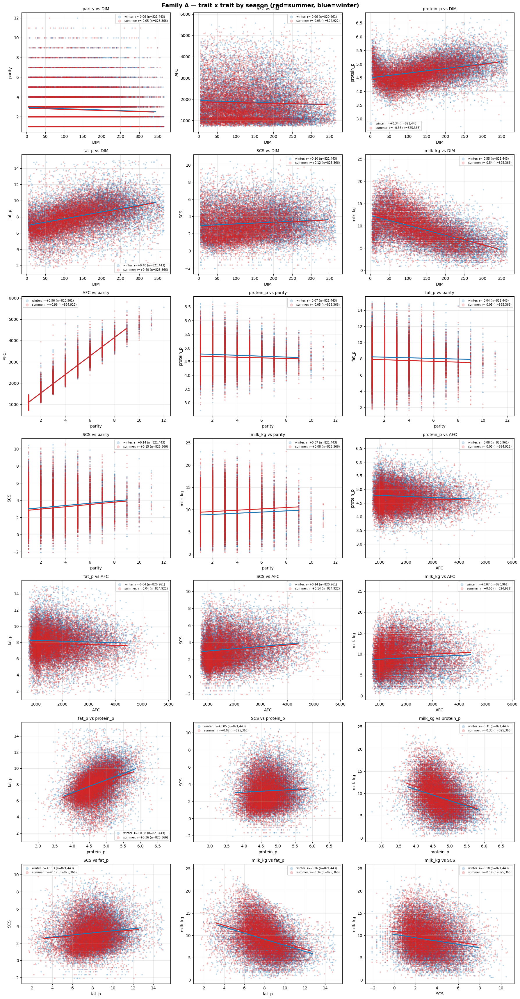

In [7]:
nrow = int(np.ceil(len(PAIRS_A) / 3))
fig, axes = plt.subplots(nrow, 3, figsize=(18, 5 * nrow))
rA = {}
for ax, (fx, fy) in zip(axes.ravel(), PAIRS_A):
    rA[(fx, fy)] = season_scatter(df, fx, fy, ax)
for ax in axes.ravel()[len(PAIRS_A):]:
    ax.axis('off')
fig.suptitle('Family A — trait x trait by season (red=summer, blue=winter)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

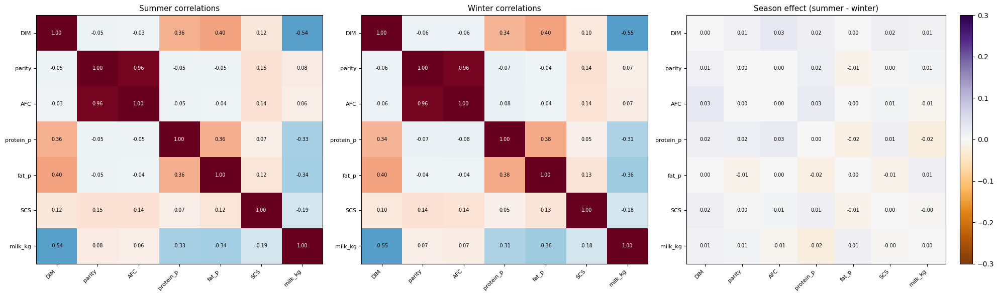

In [8]:
# Trait x trait correlation matrices per season + the season difference (summer - winter).
Csum = df[df['season'] == 'summer'][TRAITS].corr()
Cwin = df[df['season'] == 'winter'][TRAITS].corr()
Cdif = Csum - Cwin
fig, ax = plt.subplots(1, 3, figsize=(20, 6))
annot_heatmap(ax[0], Csum, 'Summer correlations')
annot_heatmap(ax[1], Cwin, 'Winter correlations')
im = annot_heatmap(ax[2], Cdif, 'Season effect (summer - winter)', vlim=0.3, cmap='PuOr')
fig.colorbar(im, ax=ax[2], fraction=0.046)
plt.tight_layout(); plt.show()

## Family B — climate × trait, coloured by season

X axis = `THI` / `Temperature` / `Humidity`; Y axis = each trait. This is the direct heat-stress view: the slope of `milk_kg vs THI`, `SCS vs THI`, etc., and how it differs between summer and winter.

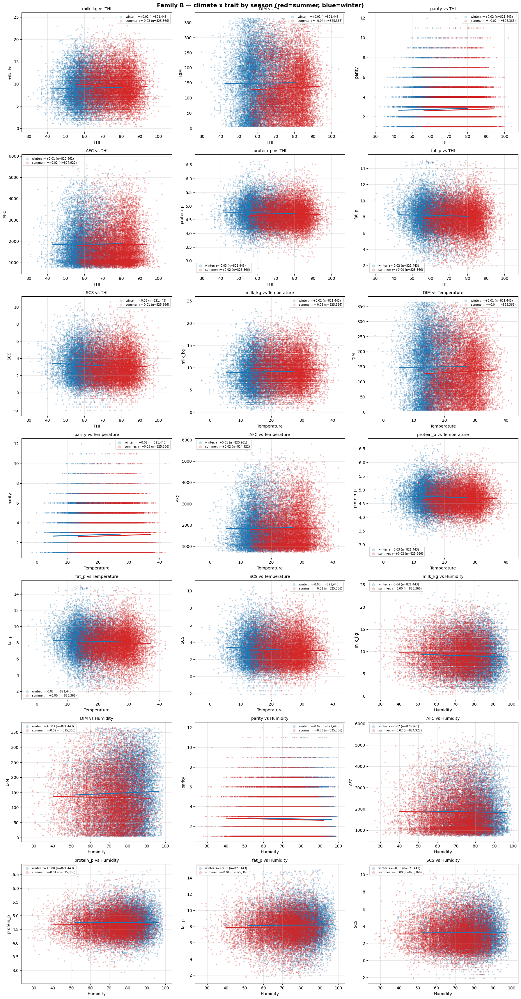

In [9]:
nrow = int(np.ceil(len(PAIRS_B) / 3))
fig, axes = plt.subplots(nrow, 3, figsize=(18, 5 * nrow))
rB = {}
for ax, (fx, fy) in zip(axes.ravel(), PAIRS_B):
    rB[(fx, fy)] = season_scatter(df, fx, fy, ax)
for ax in axes.ravel()[len(PAIRS_B):]:
    ax.axis('off')
fig.suptitle('Family B — climate x trait by season (red=summer, blue=winter)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

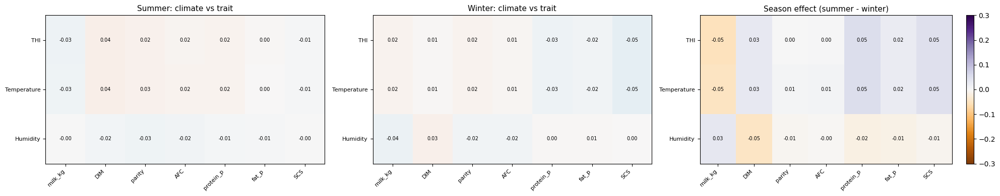

In [10]:
# Climate (rows) x trait (cols) correlation per season + season difference.
def climate_corr(frame):
    return pd.DataFrame({t: [frame[c].corr(frame[t]) for c in CLIMATE] for t in TRAITS_Y},
                        index=list(CLIMATE))

Bsum = climate_corr(df[df['season'] == 'summer'])
Bwin = climate_corr(df[df['season'] == 'winter'])
Bdif = Bsum - Bwin
fig, ax = plt.subplots(1, 3, figsize=(20, 4))
annot_heatmap(ax[0], Bsum, 'Summer: climate vs trait', vlim=0.6)
annot_heatmap(ax[1], Bwin, 'Winter: climate vs trait', vlim=0.6)
im = annot_heatmap(ax[2], Bdif, 'Season effect (summer - winter)', vlim=0.3, cmap='PuOr')
fig.colorbar(im, ax=ax[2], fraction=0.046)
plt.tight_layout(); plt.show()

## Which relationships depend most on season?

Rank every pair by the absolute change in correlation between summer and winter (`|r_summer - r_winter|`). Large values are where season most changes the relationship — the heat-stress signal.

In [11]:
rows = []
for fam, d in [('A trait-trait', rA), ('B climate-trait', rB)]:
    for (fx, fy), r in d.items():
        rows.append({'family': fam, 'pair': f'{fy} vs {fx}',
                     'r_summer': r.get('summer', np.nan), 'r_winter': r.get('winter', np.nan),
                     'abs_change': abs(r.get('summer', np.nan) - r.get('winter', np.nan))})
rank = pd.DataFrame(rows).sort_values('abs_change', ascending=False).reset_index(drop=True)
print('Top 15 most season-dependent relationships:')
display(rank.head(15).round(3))

Top 15 most season-dependent relationships:


,family,pair,r_summer,r_winter,abs_change
0,B climate-trait,milk_kg vs THI,-0.032,0.022,0.053
1,B climate-trait,protein_p vs Temperature,0.021,-0.028,0.049
2,B climate-trait,protein_p vs THI,0.021,-0.028,0.049
3,B climate-trait,milk_kg vs Temperature,-0.027,0.022,0.049
4,B climate-trait,SCS vs Temperature,-0.007,-0.052,0.046
5,B climate-trait,DIM vs Humidity,-0.016,0.030,0.046
6,B climate-trait,SCS vs THI,-0.007,-0.053,0.045
7,B climate-trait,milk_kg vs Humidity,-0.004,-0.036,0.031
8,A trait-trait,AFC vs DIM,-0.032,-0.062,0.030
9,B climate-trait,DIM vs THI,0.036,0.007,0.030


## Optional — K-Means on one pair, run separately per season

If you still want the *clustering* view, this runs K-Means **within summer** and **within winter** for a chosen pair, so you can compare whether the cluster structure itself changes with season. Axes are the real features (no PCA); `milk_kg` on Y.

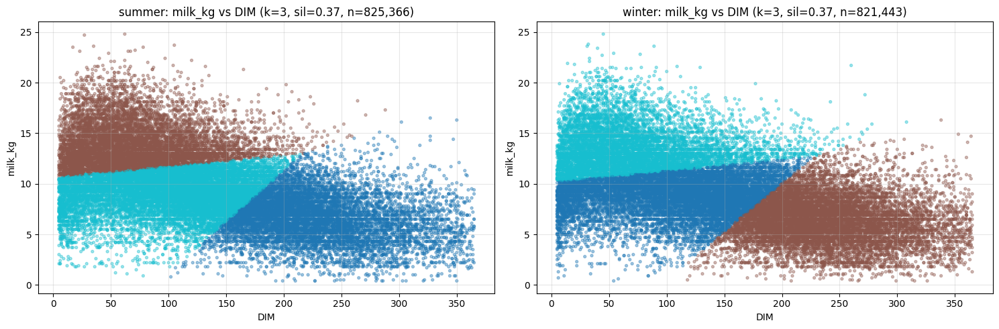

In [12]:
def cluster_pair_by_season(frame, fx, fy, k=3, sample=30000):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    for ax, s in zip(axes, ['summer', 'winter']):
        d = frame[frame['season'] == s][[fx, fy]].dropna()
        X = StandardScaler().fit_transform(d.values)
        km = KMeans(k, random_state=RANDOM_STATE, n_init=10).fit(X)
        sil = silhouette_score(X, km.labels_, sample_size=min(50000, len(X)), random_state=RANDOM_STATE)
        idx = np.random.choice(len(d), min(sample, len(d)), replace=False)
        ax.scatter(d[fx].values[idx], d[fy].values[idx], c=km.labels_[idx], cmap='tab10', s=8, alpha=0.4)
        ax.set(xlabel=fx, ylabel=fy, title=f'{s}: {fy} vs {fx} (k={k}, sil={sil:.2f}, n={len(d):,})')
        ax.grid(alpha=0.3)
    plt.tight_layout(); plt.show()

# >>> choose any pair; climate-on-X also works, e.g. ('THI', 'milk_kg') <<<
cluster_pair_by_season(df, 'DIM', 'milk_kg', k=3)

## Notes

- **No PCA.** Every axis is a measured variable; the season-coloured regression lines make the *effect of season* on each correlation explicit.
- **Season split** uses the warm half (`WARM_MONTHS`) vs the rest, so every record is in exactly one season. Change `WARM_MONTHS` to use strict summer (`{6,7,8,9}`) if the professors prefer a tighter definition.
- **Climate columns** are configurable in `CLIMATE` (currently daily-max THI, daily-max temperature, daily-avg humidity). Swap to `THI_2_avg`, `temperature_avg`, etc. if needed.
- **Reading the result:** the `season effect (summer - winter)` heatmaps and the season-dependence ranking are the headline — they show which trait/climate relationships are genuinely altered by heat, complementing the formal heat→SCS test in `Clustering_CurveShape_Heat.ipynb` / `Clustering_TimeSeries.ipynb`.
- Note that `parity` and `AFC` are discrete / animal-level; their per-record correlations are structural rather than biological signal — interpret those panels with care.

## Cloud density (where the mass actually is)

The scatter blobs above are completely overplotted — 800k points stack on top of each other, so you can't see where buffalo actually concentrate. These views fix that two ways:

- **Density contours by season** — for each pair, draw lines enclosing the densest 90/60/30/10% of each season's cloud (red = summer, blue = winter). Where the contours sit shows the bulk of the data; the dashed line is the per-season regression. Overlapping red/blue contours = the two seasons occupy the same region (no season effect).
- **Hexbin drill-down** — a true per-season density map (colour = log count per cell) for a chosen pair.

In [13]:
def _smooth(H, passes=1):
    """Light 3x3 box blur (pure numpy, no scipy) to make contours readable."""
    for _ in range(passes):
        P = np.pad(H, 1, mode='edge')
        H = (P[:-2,:-2] + P[:-2,1:-1] + P[:-2,2:] +
             P[1:-1,:-2] + P[1:-1,1:-1] + P[1:-1,2:] +
             P[2:,:-2] + P[2:,1:-1] + P[2:,2:]) / 9.0
    return H


def season_density(frame, fx, fy, ax, bins=60, sample=150000, levels=(0.1, 0.3, 0.6, 0.9)):
    """Per-season 2-D density contours of the (fx, fy) cloud + per-season regression line."""
    sub = frame[[fx, fy, 'season']].dropna()
    xr = (sub[fx].quantile(0.005), sub[fx].quantile(0.995))
    yr = (sub[fy].quantile(0.005), sub[fy].quantile(0.995))
    if xr[0] == xr[1] or yr[0] == yr[1]:
        ax.set_title(f'{fy} vs {fx} (no spread)', fontsize=10); return
    for s in ['winter', 'summer']:
        d = sub[sub['season'] == s]
        if len(d) < 50:
            continue
        if len(d) > sample:
            d = d.sample(sample, random_state=RANDOM_STATE)
        H, xe, ye = np.histogram2d(d[fx], d[fy], bins=bins, range=[xr, yr])
        H = _smooth(H.T, passes=2)
        if H.max() <= 0:
            continue
        xc = (xe[:-1] + xe[1:]) / 2; yc = (ye[:-1] + ye[1:]) / 2
        ax.contour(xc, yc, H / H.max(), levels=list(levels),
                   colors=SEASON_COLORS[s], linewidths=1.1, alpha=0.85)
        slope, intercept = np.polyfit(d[fx], d[fy], 1)
        xs = np.linspace(*xr, 50)
        ax.plot(xs, intercept + slope * xs, color=SEASON_COLORS[s], lw=2, ls='--')
    from matplotlib.lines import Line2D
    ax.legend([Line2D([0], [0], color=SEASON_COLORS['summer']),
               Line2D([0], [0], color=SEASON_COLORS['winter'])],
              ['summer', 'winter'], fontsize=7, loc='best')
    ax.set(xlabel=fx, ylabel=fy, xlim=xr, ylim=yr, title=f'{fy} vs {fx}')
    ax.grid(alpha=0.3)


def pair_hexbin(frame, fx, fy, gridsize=50):
    """True density map (log counts) for one pair, summer vs winter side by side."""
    sub = frame[[fx, fy, 'season']].dropna()
    xr = (sub[fx].quantile(0.005), sub[fx].quantile(0.995))
    yr = (sub[fy].quantile(0.005), sub[fy].quantile(0.995))
    fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)
    for ax, s in zip(axes, ['summer', 'winter']):
        d = sub[sub['season'] == s]
        hb = ax.hexbin(d[fx], d[fy], gridsize=gridsize, cmap='viridis', mincnt=1,
                       bins='log', extent=[xr[0], xr[1], yr[0], yr[1]])
        fig.colorbar(hb, ax=ax, label='log10(count)')
        slope, intercept = np.polyfit(d[fx], d[fy], 1)
        xs = np.linspace(*xr, 50)
        ax.plot(xs, intercept + slope * xs, 'r--', lw=2)
        ax.set(xlabel=fx, ylabel=fy, title=f'{s}: {fy} vs {fx} (n={len(d):,})')
    plt.tight_layout(); plt.show()

### Family A — trait × trait density contours by season

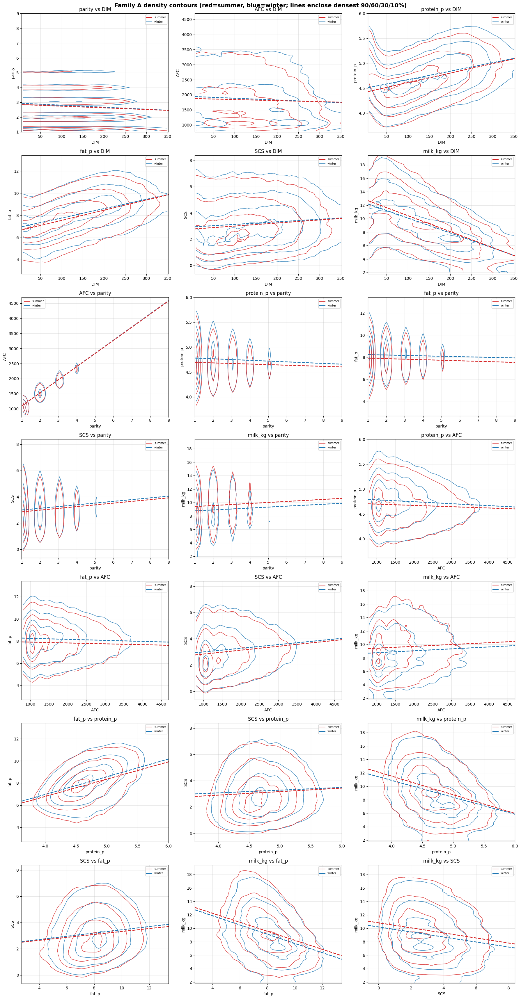

In [14]:
nrow = int(np.ceil(len(PAIRS_A) / 3))
fig, axes = plt.subplots(nrow, 3, figsize=(18, 5 * nrow))
for ax, (fx, fy) in zip(axes.ravel(), PAIRS_A):
    season_density(df, fx, fy, ax)
for ax in axes.ravel()[len(PAIRS_A):]:
    ax.axis('off')
fig.suptitle('Family A density contours (red=summer, blue=winter; lines enclose densest 90/60/30/10%)',
             fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

### Family B — climate × trait density contours by season

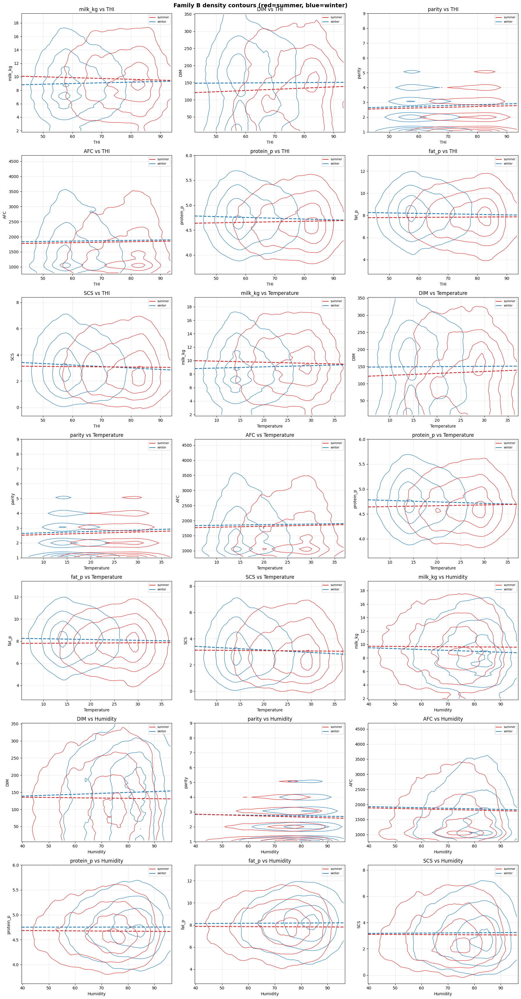

In [15]:
nrow = int(np.ceil(len(PAIRS_B) / 3))
fig, axes = plt.subplots(nrow, 3, figsize=(18, 5 * nrow))
for ax, (fx, fy) in zip(axes.ravel(), PAIRS_B):
    season_density(df, fx, fy, ax)
for ax in axes.ravel()[len(PAIRS_B):]:
    ax.axis('off')
fig.suptitle('Family B density contours (red=summer, blue=winter)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

### Hexbin drill-down for key pairs

True per-season density maps (brighter = more records) for the most relevant pairs. Change the arguments to inspect any pair, e.g. `pair_hexbin(df, 'Humidity', 'SCS')`.

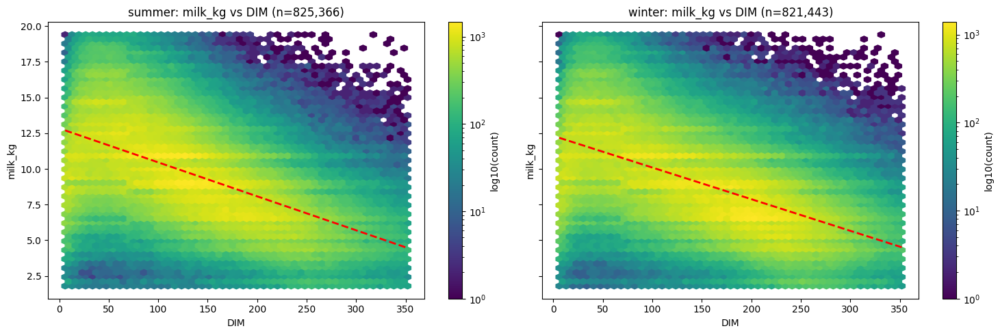

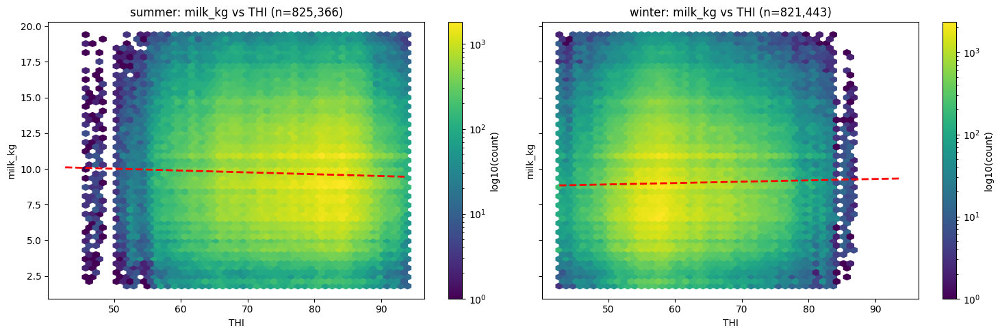

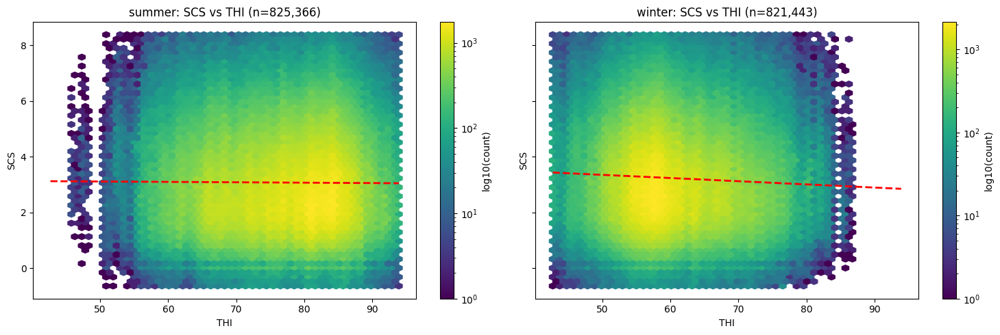

In [16]:
pair_hexbin(df, 'DIM', 'milk_kg')      # the lactation curve cloud
pair_hexbin(df, 'THI', 'milk_kg')      # heat vs yield
pair_hexbin(df, 'THI', 'SCS')          # heat vs udder health